# **Setup Steps** - Required
1. Uncomment the first two code cells (enter the code cell and press `Ctrl a` to highlight all and `Ctrl /` to uncomment the whole cell)
2. Run the first code cell to uninstall the conflicting packages.
3. Run the second code cell to install the package dependencies. This might take several minutes.
4. Restart the notebook runtime before continuing. To do so, open the `Runtime` menu and click `Restart runtime` in the drop-down menu as shown in the image below. Once the notebook kernel restarts do not run the first two code cells again.
![google-colab-restart-notebook-runtime](https://github.com/cj-mills/christianjmills/raw/master/images/icevision-openvino-unity-tutorial/google-colab-restart-notebook-runtime.png)
5. Re-comment the first two code cells (enter the code cell and press `Ctrl a` to highlight all and `Ctrl /` to comment the whole cell).
6. Execute the notebook starting from the `from icevision.all import *` cell.
7. You will know everything is working if the `from icevision.all import *` cell has the following output.
```text
INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:70
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31
```

**Uninstall conflicting packages**

In [ ]:
# %%capture 
# !pip uninstall tensorflow -y
# !pip uninstall thinc -y
# !pip uninstall fastai -y
# !pip uninstall fastcore -y
# !pip uninstall spacy -y
# !pip uninstall en-core-web-sm -y
# !pip uninstall torchtext -y

**Install Dependencies**

In [ ]:
# %%capture
# !pip install -U torch==1.10.0+cu111 torchvision==0.11.1+cu111 -f https://download.pytorch.org/whl/torch_stable.html
# !pip install mmcv-full==1.3.17 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
# !pip install mmdet==2.17.0
# !pip install icevision==0.11.0
# !pip install icedata==0.5.1
# !pip install -U setuptools==59.5.0
# !pip install -U pillow
# !pip install -U numpy
# !pip install -U onnxruntime

# **Required:** Restart the notebook after installing dependencies and do not rerun the above code cells

**Import IceVision library**

In [1]:
from icevision.all import *

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /home/innom-dt/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


**Import and configure Pandas**

In [2]:
import pandas as pd
pd.set_option('max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

**Clone dataset repository**

In [3]:
!git clone https://github.com/MbassiJaphet/pytorch-for-information-extraction.git

Cloning into 'pytorch-for-information-extraction'...
remote: Enumerating objects: 1170, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 1170 (delta 6), reused 5 (delta 5), pack-reused 1150
Receiving objects: 100% (1170/1170), 39.14 MiB | 3.15 MiB/s, done.
Resolving deltas: 100% (556/556), done.


**Define path to dataset**

In [4]:
data_dir = Path('./pytorch-for-information-extraction/code/datasets/detection/student-id')
dataset_name = data_dir.name

**Inspect dataset contents**

In [5]:
pd.DataFrame(list(data_dir.ls())).head()

,0
0,pytorch-for-information-extraction/code/datasets/detection/student-id/10001.jpg
1,pytorch-for-information-extraction/code/datasets/detection/student-id/10001.json
2,pytorch-for-information-extraction/code/datasets/detection/student-id/10002.jpg
3,pytorch-for-information-extraction/code/datasets/detection/student-id/10002.json
4,pytorch-for-information-extraction/code/datasets/detection/student-id/10003.jpg


**Get image file paths**

In [6]:
files = get_image_files(data_dir)
len(files)

150

**Inspect one of the training images**

Image Dims: (480, 640)


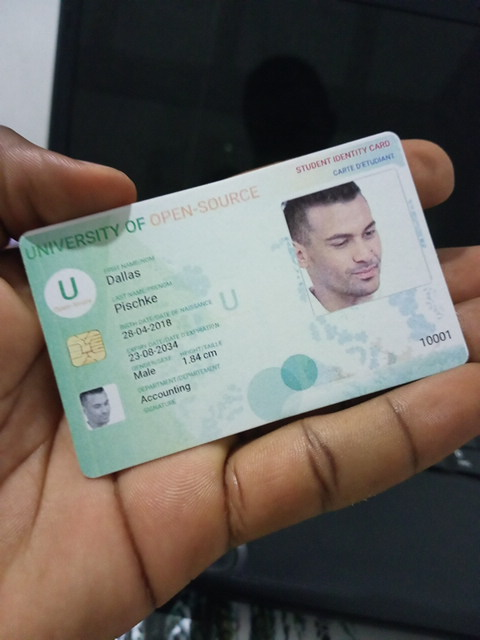

In [7]:
import PIL
img = PIL.Image.open(files[0]).convert('RGB')
print(f"Image Dims: {img.size}")
img

**Create a dictionary that maps image names to file paths**

In [8]:
img_dict = {file.name.split('.')[0] : file for file in files}
pd.DataFrame(list(img_dict.items())[0]).transpose()

,0,1
0,10001,pytorch-for-information-extraction/code/datasets/detection/student-id/10001.jpg


**Get list of annotation file paths**

In [9]:
import os
from glob import glob

In [10]:
annotation_paths = glob(os.path.join(data_dir, "*.json"))
pd.DataFrame(annotation_paths).head()

,0
0,pytorch-for-information-extraction/code/datasets/detection/student-id/10001.json
1,pytorch-for-information-extraction/code/datasets/detection/student-id/10002.json
2,pytorch-for-information-extraction/code/datasets/detection/student-id/10003.json
3,pytorch-for-information-extraction/code/datasets/detection/student-id/10004.json
4,pytorch-for-information-extraction/code/datasets/detection/student-id/10005.json


**Create annotation dataframe**

In [11]:
cls_dataframes = (pd.read_json(f, orient='index').transpose() for f in annotation_paths)
annotation_df = pd.concat(cls_dataframes, ignore_index=False)
annotation_df['index'] = annotation_df.apply(lambda row: row['imagePath'].split('.')[0], axis=1)
annotation_df = annotation_df.set_index('index')
annotation_df = annotation_df.loc[list(img_dict.keys())]
annotation_df.head()

,version,flags,shapes,lineColor,fillColor,imagePath,imageData,imageHeight,imageWidth
index,,,,,,,,,
10001,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[19.190476190476204, 244.76190476190476], [23.0, 233.33333333333331], [385.8571428571428, 132.38095238095238], [400.1428571428571, 135.23809523809524], [468.71428571428567, 353.3333333333333], [466.80952380952374, 362.85714285714283], [97.28571428571428, 478.0952380952381], [81.09523809523807, 474.2857142857143]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10001.jpg,,640,480
10002,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[21.095238095238102, 183.33333333333334], [231.41269841269843, 88.09523809523809], [450.46031746031747, 347.6190476190476], [475.06349206349205, 376.1904761904762], [478.2380952380952, 388.8888888888889], [301.25396825396825, 532.5396825396825], [271.0952380952381, 556.3492063492064], [255.22222222222223, 541.2698412698413], [242.52380952380952, 534.9206349206349], [25.85714285714286, 199.20634920634922]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10002.jpg,,640,480
10003,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[138.23809523809524, 71.42857142857143], [407.7619047619047, 31.428571428571427], [418.2380952380952, 39.047619047619044], [422.04761904761904, 539.047619047619], [407.7619047619047, 552.3809523809524], [112.52380952380952, 519.047619047619], [98.23809523809524, 505.71428571428567]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10003.jpg,,640,480
10004,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[119.20529801324503, 218.54304635761588], [440.3973509933775, 184.7682119205298], [445.0331125827814, 190.72847682119206], [391.3907284768212, 366.2251655629139], [384.7682119205298, 372.18543046357615], [250.33112582781456, 401.3245033112583], [82.11920529801324, 446.3576158940397], [76.82119205298014, 441.72185430463577], [49.66887417218544, 239.73509933774835], [107.28476821192052, 228.47682119205297]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10004.jpg,,640,480
10005,3.21.1,{},"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[41.18840579710144, 218.8405797101449], [41.18840579710144, 209.42028985507244], [52.78260869565216, 201.44927536231882], [224.52173913043475, 142.75362318840578], [359.30434782608694, 89.85507246376811], [367.99999999999994, 92.02898550724638], [462.2028985507246, 275.3623188405797], [369.4492753623188, 348.5507246376811], [199.88405797101444, 472.463768115942], [191.91304347826082, 471.01449275362313]], 'shape_type': 'polygon', 'flags': {}}]","[0, 255, 0, 128]","[255, 0, 0, 128]",10005.jpg,,640,480


**Inspect annotation data for sample image**

In [12]:
file_id = files[56].name.split('.')[0]
file_id

'10057'

In [13]:
annotation_df.loc[file_id].to_frame()

,10057
version,3.21.1
flags,{}
shapes,"[{'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[4.703296703296701, 186.8131868131868], [172.28571428571428, 91.20879120879121], [177.23076923076923, 89.56043956043956], [183.82417582417582, 92.85714285714285], [260.19780219780216, 161.53846153846152], [248.65934065934067, 173.07692307692307], [99.75824175824175, 273.6263736263736], [88.2197802197802, 280.7692307692308], [83.27472527472527, 280.7692307692308], [35.472527472527474, 225.82417582417582]], 'shape_type': 'polygon', 'flags': {}}, {'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[245.36263736263737, 134.06593406593407], [346.46153846153845, 100.0], [352.5054945054945, 101.64835164835165], [465.1428571428571, 248.9010989010989], [461.8461538461538, 252.1978021978022], [356.35164835164835, 300.5494505494505], [350.3076923076923, 297.8021978021978]], 'shape_type': 'polygon', 'flags': {}}, {'label': 'student_id', 'line_color': None, 'fill_color': None, 'points': [[33.27472527472527, 489.010989010989], [159.64835164835165, 281.3186813186813], [166.7912087912088, 271.97802197802196], [172.28571428571428, 270.3296703296703], [297.010989010989, 330.2197802197802], [300.3076923076923, 335.16483516483515], [299.2087912087912, 340.65934065934067], [223.38461538461536, 506.5934065934066], [192.6153846153846, 571.4285714285714], [184.9230769230769, 574.1758241758241], [172.28571428571428, 569.2307692307692], [47.56043956043956, 501.0989010989011], [36.021978021978015, 496.15384615384613]], 'shape_type': 'polygon', 'flags': {}}]"
lineColor,"[0, 255, 0, 128]"
fillColor,"[255, 0, 0, 128]"
imagePath,10057.jpg
imageData,
imageHeight,640
imageWidth,480


**Download font file**

In [14]:
font_file = 'KFOlCnqEu92Fr1MmEU9vAw.ttf'
if not os.path.exists(font_file): 
    !wget https://fonts.gstatic.com/s/roboto/v30/$font_file

**Annotate sample image**

In [15]:
from PIL import ImageDraw

(480, 640)


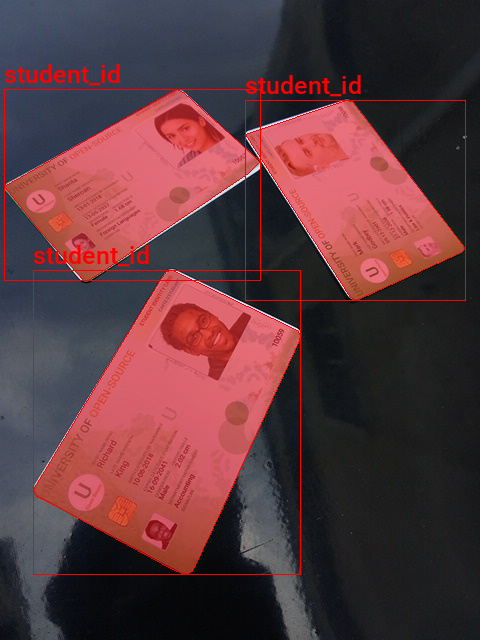

In [16]:
img = PIL.Image.open(img_dict[file_id]).convert('RGB')
width, height = img.size
annotated_img = img.copy()
mask_img = PIL.Image.new('L', img.size, 0)
draw = ImageDraw.Draw(annotated_img)
fnt_size = 25
annotation = annotation_df.loc[file_id]

# Iterate through annotations for sample image
for i in range(len(annotation['shapes'])):
    
    # Extract mask polygon coords
    points = np.array(annotation['shapes'][i]['points'])
    
    # Extract bounding box coords
    x_min, y_min = points.min(axis=0)
    x_max, y_max = points.max(axis=0)
    
    # Draw bounding box on sample image
    shape = (x_min, y_min, x_max, y_max)
    draw.rectangle(shape, outline='red')

    # Draw segmentation mask on sample image
    xy = [(p[0],p[1]) for p in points]
    ImageDraw.Draw(annotated_img, 'RGBA').polygon(xy, fill=(255, 0, 0, 125), outline ="red")
    
    # Draw segmentation mask on blank image
    ImageDraw.Draw(mask_img, 'L').polygon(xy, fill=(255))
    
    # Draw object label on sample image
    fnt = PIL.ImageFont.truetype(font_file, fnt_size)
    label = annotation['shapes'][i]['label']
    draw.multiline_text((x_min, y_min-fnt_size-5), f"{label}", font=fnt, fill='red')
    
print(annotated_img.size) 
annotated_img

**Display segmentation mask**

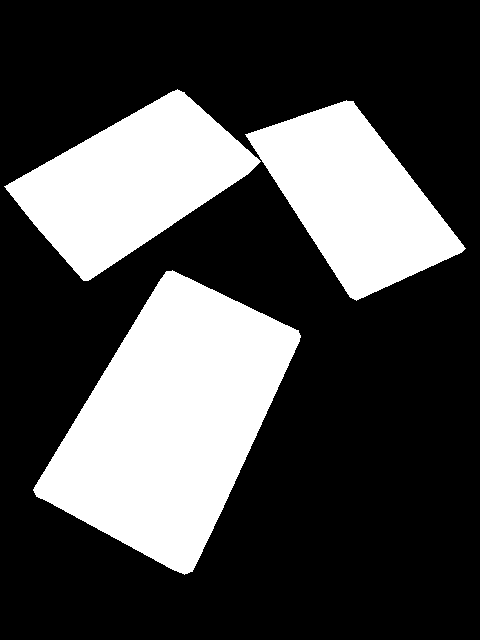

In [17]:
mask_img

**Create a class map**

In [18]:
shapes_df = annotation_df['shapes'].explode().to_frame().shapes.apply(pd.Series)
shapes_df.head()

,label,line_color,fill_color,points,shape_type,flags
index,,,,,,
10001,student_id,None,None,"[[19.190476190476204, 244.76190476190476], [23.0, 233.33333333333331], [385.8571428571428, 132.38095238095238], [400.1428571428571, 135.23809523809524], [468.71428571428567, 353.3333333333333], [466.80952380952374, 362.85714285714283], [97.28571428571428, 478.0952380952381], [81.09523809523807, 474.2857142857143]]",polygon,{}
10002,student_id,None,None,"[[21.095238095238102, 183.33333333333334], [231.41269841269843, 88.09523809523809], [450.46031746031747, 347.6190476190476], [475.06349206349205, 376.1904761904762], [478.2380952380952, 388.8888888888889], [301.25396825396825, 532.5396825396825], [271.0952380952381, 556.3492063492064], [255.22222222222223, 541.2698412698413], [242.52380952380952, 534.9206349206349], [25.85714285714286, 199.20634920634922]]",polygon,{}
10003,student_id,None,None,"[[138.23809523809524, 71.42857142857143], [407.7619047619047, 31.428571428571427], [418.2380952380952, 39.047619047619044], [422.04761904761904, 539.047619047619], [407.7619047619047, 552.3809523809524], [112.52380952380952, 519.047619047619], [98.23809523809524, 505.71428571428567]]",polygon,{}
10004,student_id,None,None,"[[119.20529801324503, 218.54304635761588], [440.3973509933775, 184.7682119205298], [445.0331125827814, 190.72847682119206], [391.3907284768212, 366.2251655629139], [384.7682119205298, 372.18543046357615], [250.33112582781456, 401.3245033112583], [82.11920529801324, 446.3576158940397], [76.82119205298014, 441.72185430463577], [49.66887417218544, 239.73509933774835], [107.28476821192052, 228.47682119205297]]",polygon,{}
10005,student_id,None,None,"[[41.18840579710144, 218.8405797101449], [41.18840579710144, 209.42028985507244], [52.78260869565216, 201.44927536231882], [224.52173913043475, 142.75362318840578], [359.30434782608694, 89.85507246376811], [367.99999999999994, 92.02898550724638], [462.2028985507246, 275.3623188405797], [369.4492753623188, 348.5507246376811], [199.88405797101444, 472.463768115942], [191.91304347826082, 471.01449275362313]]",polygon,{}


In [19]:
labels = shapes_df['label'].unique().tolist()
labels

['student_id']

In [20]:
class_map = ClassMap(labels)
class_map

<ClassMap: {'background': 0, 'student_id': 1}>

**View template for an instance segmentation record**

In [21]:
template_record = InstanceSegmentationRecord()
template_record

BaseRecord

common: 
	- Filepath: None
	- Img: None
	- Record ID: None
	- Image size None
detection: 
	- masks: []
	- mask_array: None
	- BBoxes: []
	- Class Map: None
	- Labels: []

**View template for an instance segmentation parser**

In [22]:
Parser.generate_template(template_record)

class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_filepath(<Union[str, Path]>)
        record.set_img_size(<ImgSize>)
        record.detection.add_masks(<Sequence[Mask]>)
        record.detection.add_bboxes(<Sequence[BBox]>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)


**Define custom parser class**

In [23]:
class StudentIDParser(Parser):
    def __init__(self, template_record, annotations_df, img_dict, class_map):
        super().__init__(template_record=template_record)
        self.img_dict = img_dict
        self.df = annotations_df
        self.class_map = class_map

    def __iter__(self):
        for o in self.df.itertuples(): yield o

    def __len__(self):
        return len(self.df)

    def record_id(self, o: Any) -> Hashable:
        return o.Index

    def image_width_height(self, o) -> Tuple[int, int]:
        return self._size[:2]

    def parse_fields(self, o, record, is_new):
        
        filepath = self.img_dict[o.Index]
        
        width, height = PIL.Image.open(filepath).convert('RGB').size
        
        record.set_img_size([width, height])
        record.set_filepath(Path(filepath))
        record.detection.set_class_map(self.class_map)
                
        labels = []
        bbox_list = []
        mask_list = []
        
        for i in range(len(o.shapes)):
            points = np.array(o.shapes[i]['points'])

            x_min, y_min = points.min(axis=0)
            x_max, y_max = points.max(axis=0)
            
            labels.append(o.shapes[i]['label'])
            bbox_list.append(BBox.from_xyxy(x_min, y_min, x_max, y_max))
            
            mask_img = PIL.Image.new('L', (width, height), 0)
            xy = [(p[0],p[1]) for p in points]
            ImageDraw.Draw(mask_img, 'L').polygon(xy, fill=(1))
            mask_array = np.array(mask_img).clip(0,1)
            mask_list.append(MaskArray(mask_array))
        
        record.detection.add_labels(labels)
        record.detection.add_bboxes(bbox_list)
        record.detection.add_masks(mask_list)

**Create a custom parser object**

In [24]:
parser = StudentIDParser(template_record, annotation_df, img_dict, class_map)
len(parser)

150

**Parse annotations to create records**

In [25]:
# Randomly split our data into train/valid
data_splitter = RandomSplitter([0.8, 0.2])

train_records, valid_records = parser.parse(data_splitter)
# train_records, valid_records = parser.parse(data_splitter, cache_filepath=f'{dataset_name}-cache.pkl')

  0%|          | 0/150 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/150 [00:00<?, ?it/s]

**Export class labels**

In [26]:
import json

class_labels = {"classes": parser.class_map.get_classes()}
class_labels_file_name = f"{data_dir.name}-classes.json"

with open(class_labels_file_name, "w") as write_file:
    json.dump(class_labels, write_file)
    
class_labels, class_labels_file_name

({'classes': ['background', 'student_id']}, 'student-id-classes.json')

**Inspect training records**

In [27]:
train_records[0]

BaseRecord

common: 
	- Filepath: pytorch-for-information-extraction/code/datasets/detection/student-id/10089.jpg
	- Img: None
	- Record ID: 10089
	- Image size [640, 480]
detection: 
	- masks: [<icevision.core.mask.MaskArray object at 0x7f162fb9bcd0>]
	- mask_array: None
	- BBoxes: [<BBox (xmin:92.28571428571428, ymin:0.0, xmax:528.7142857142857, ymax:418.57142857142856)>]
	- Class Map: <ClassMap: {'background': 0, 'student_id': 1}>
	- Labels: [1]

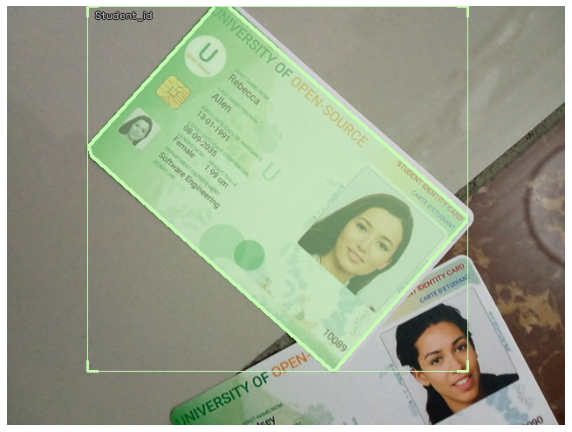

In [28]:
show_record(train_records[0], figsize = (10,10), display_label=True )

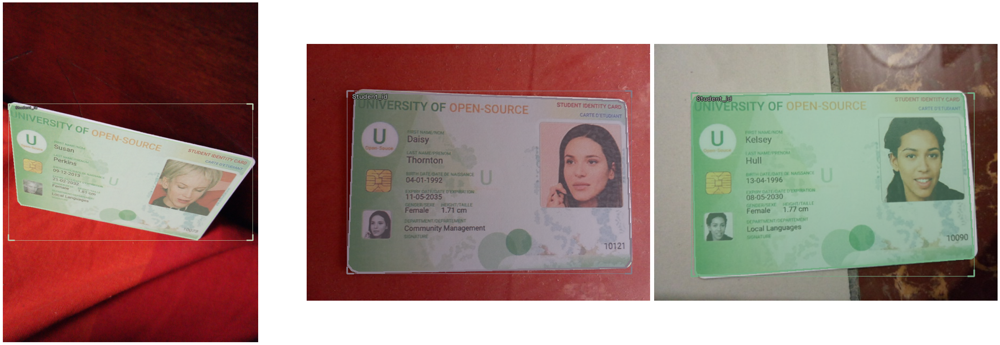

In [29]:
show_records(train_records[1:4], ncols=3,display_label=True)

**Define input resolution**

In [30]:
image_size = 512
presize = 1024

**Define Transforms**

In [31]:
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

**Get normalization stats**

In [32]:
mean = tfms.A.Normalize().mean
std = tfms.A.Normalize().std
mean, std

((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))

**Define Datasets**

In [33]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)
train_ds, valid_ds

(<Dataset with 120 items>, <Dataset with 30 items>)

**Apply augmentations to a training sample**

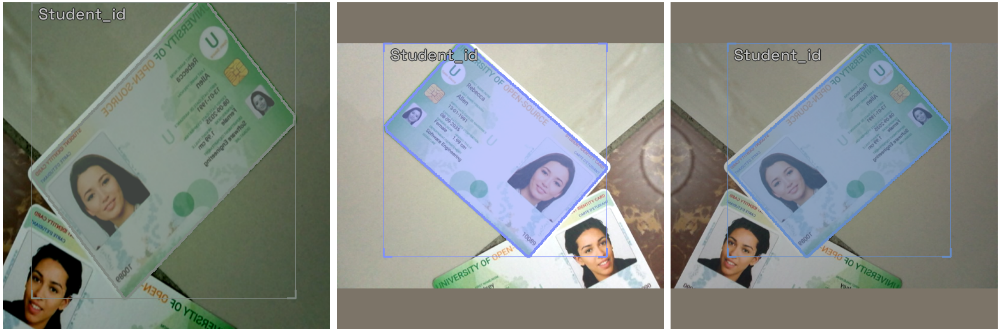

In [34]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

**Define model type**

In [35]:
model_type = models.torchvision.mask_rcnn

**Define backbone**

In [36]:
backbone = model_type.backbones.resnet50_fpn()

**Define batch size**

In [37]:
bs = 4

**Define DataLoaders**

In [38]:
train_dl = model_type.train_dl(train_ds, batch_size=bs, num_workers=2, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=bs, num_workers=2, shuffle=False)

In [39]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=8, shuffle=False)

In [40]:
valid_batch = first(valid_dl)
infer_batch = first(infer_dl)

In [41]:
(valid_images, valid_labels), valid_records = valid_batch

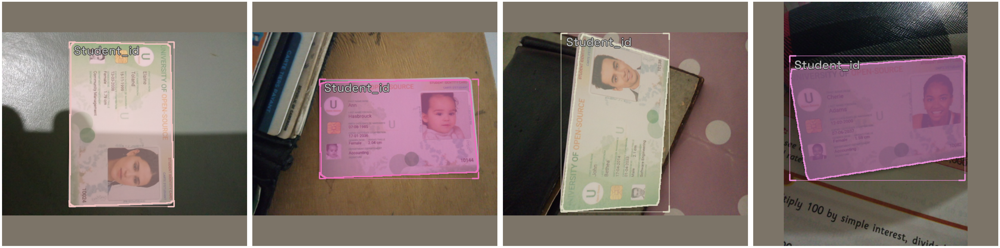

In [42]:
model_type.show_batch(first(valid_dl), ncols=4)

**Instantiate the model**

In [43]:
model = model_type.model(backbone=backbone, num_classes=parser.class_map.num_classes) 

**Define metrics**

In [44]:
metrics = [COCOMetric(metric_type=COCOMetricType.mask)]

**Define Learner object**

In [45]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

**Find learning rate**

/home/innom-dt/mambaforge/envs/icevision/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


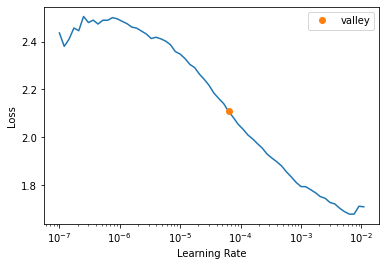

In [46]:
suggested_lrs = learn.lr_find()

**Define learning rate**

In [47]:
lr = suggested_lrs.valley*3
lr

0.0001892872096505016

**Define number of epochs**

In [48]:
epochs = 60

**Finetune model**

In [49]:
learn.fine_tune(epochs, lr, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.555203,1.115328,0.000000,00:05


epoch,train_loss,valid_loss,COCOMetric,time
0,1.166290,1.060038,0.000000,00:10
1,1.126187,0.907818,0.000000,00:09
2,0.984708,0.679401,0.000000,00:08
3,0.817924,0.497735,0.000000,00:08
4,0.670204,0.401344,0.000000,00:08
5,0.565293,0.344582,0.000000,00:08
6,0.481657,0.336061,0.000000,00:08
7,0.430384,0.287910,0.000000,00:08
8,0.392278,0.275064,0.000000,00:08
9,0.374451,0.284373,0.000000,00:08


**Show results on validation set**

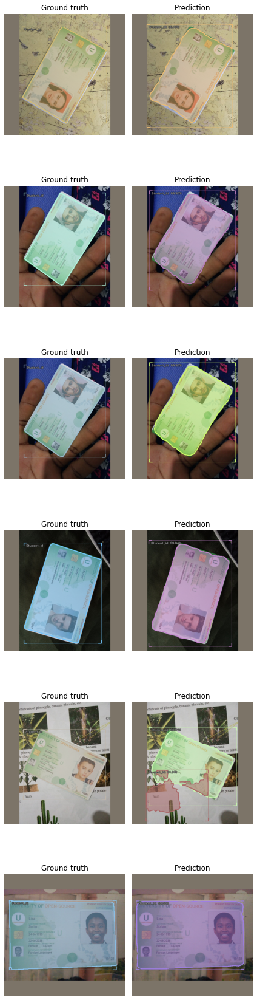

In [50]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

**Define model checkpoint file path**

In [51]:
checkpoint_path = f"{data_dir.name}-{type(model).__name__}.pth"
checkpoint_path

'student-id-MaskRCNN.pth'

**Save model checkpoint**

In [52]:
torch.save(model.state_dict(), checkpoint_path)

**Load class labels**

In [53]:
with open(class_labels_file_name, "r") as read_file:
    classes = json.loads(read_file.read())
classes['classes']

['background', 'student_id']

**Load model checkpoint**

In [54]:
checkpoint_and_model = models.model_from_checkpoint(checkpoint_path, 
                                                    model_name='torchvision.mask_rcnn', 
                                                    backbone_name='resnet50_fpn',
                                                    img_size=512, 
                                                    classes=classes['classes'],
                                                   )

Use load_from_local loader


**Verify class map**

In [55]:
checkpoint_and_model["class_map"]

<ClassMap: {'background': 0, 'student_id': 1}>

**Get model and device**

In [56]:
model = checkpoint_and_model["model"]

device=next(model.parameters()).device
device

device(type='cpu')

**Define inference preprocessing steps**

In [57]:
img_size = checkpoint_and_model["img_size"]
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

**Select a test image**

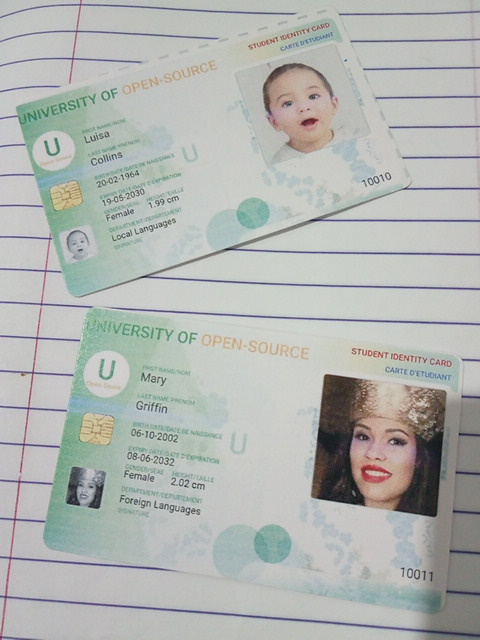

In [58]:
test_img = open_img(files[9])
test_img

**Define inference dataloader**

In [59]:
infer_tfms = tfms.A.Adapter([tfms.A.Normalize()])
infer_ds = Dataset.from_images([test_img], infer_tfms)
infer_dl = model_type.infer_dl(infer_ds, batch_size=1, shuffle=False)

**Perform inference**

In [60]:
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/1 [00:00<?, ?it/s]

**Inspect source image**

In [61]:
preds[0].ground_truth

BaseRecord

common: 
	- Img: 480x640x3 <np.ndarray> Image
	- Image size ImgSize(width=480, height=640)
	- Record ID: 0
detection: 
	- Class Map: None

**Inspect model prediction**

In [62]:
preds[0].pred

BaseRecord

common: 
	- Img: 480x640x3 <np.ndarray> Image
	- Image size ImgSize(width=480, height=640)
	- Record ID: 0
detection: 
	- masks: []
	- mask_array: <icevision.core.mask.MaskArray object at 0x7f162f87c040>
	- Scores: [0.99958867 0.9995383 ]
	- BBoxes: [<BBox (xmin:12.27349853515625, ymin:15.78326416015625, xmax:411.28472900390625, ymax:298.0199279785156)>, <BBox (xmin:32.996551513671875, ymin:301.24139404296875, xmax:460.0133056640625, ymax:614.513671875)>]
	- Class Map: None
	- Labels: [1, 1]

**Annotate image with model prediction**

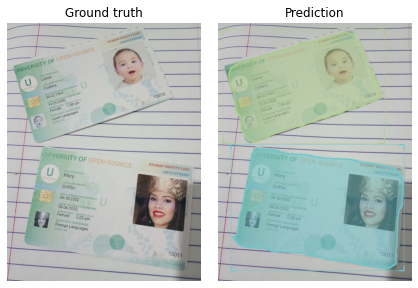

In [63]:
show_preds(preds=preds)

**Define method to convert a PIL Image to a Pytorch Tensor**

In [64]:
def img_to_tensor(img:PIL.Image, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    # Convert image to tensor
    img_tensor = torch.Tensor(np.array(img)).permute(2, 0, 1)
    # Scale pixels values from [0,255] to [0,1]
    scaled_tensor = img_tensor.float().div_(255)
    # Prepare normalization tensors
    mean_tensor = tensor(mean).view(1,1,-1).permute(2, 0, 1)
    std_tensor = tensor(std).view(1,1,-1).permute(2, 0, 1)
    # Normalize tensor    
    normalized_tensor = (scaled_tensor - mean_tensor) / std_tensor
    # Batch tensor
    return normalized_tensor.unsqueeze(dim=0)

**Convert image to a normalized tensor**

In [65]:
input_tensor = img_to_tensor(test_img)
input_tensor.shape

torch.Size([1, 3, 640, 480])

**Inspect raw model output**

In [66]:
with torch.no_grad():
    preds = model(input_tensor)
preds

[{'boxes': tensor([[ 12.2735,  15.7833, 411.2848, 298.0199],
          [ 32.9966, 301.2414, 460.0133, 614.5137]]),
  'labels': tensor([1, 1]),
  'scores': tensor([0.9996, 0.9995]),
  'masks': tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            ...,
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.]]],
  
  
          [[[0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            ...,
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.]]]])}]

**Benckmark PyTorch CPU inference**

In [67]:
%%timeit
with torch.no_grad(): model(input_tensor)

446 ms ± 5.13 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


**Define ONNX file name**

In [68]:
onnx_file_name = f"{dataset_name}-{type(model).__name__}.onnx"
onnx_file_name

'student-id-MaskRCNN.onnx'

**Export trained model to ONNX**

In [69]:
torch.onnx.export(model,
                  input_tensor,
                  onnx_file_name,
                  export_params=True,
                  opset_version=12,
                  do_constant_folding=True,
                  input_names = ['input'],
                  output_names = ['boxes', 'labels', 'scores', 'masks'],
                  dynamic_axes={'input': {2 : 'height', 3 : 'width'}}
                 )

/home/innom-dt/mambaforge/envs/icevision/lib/python3.8/site-packages/torchvision/models/detection/anchor_utils.py:122: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  strides = [[torch.tensor(image_size[0] // g[0], dtype=torch.int64, device=device),
/home/innom-dt/mambaforge/envs/icevision/lib/python3.8/site-packages/torchvision/models/detection/anchor_utils.py:122: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  strides = [[torch.tensor(image_size[0] // g[0], dtype=torch.int64, device=device),
/home/innom-dt/mamba

**Import ONNX Runtime**

In [70]:
import onnxruntime as ort

**Get available ONNX Runtime execution providers**

In [71]:
available_providers = ort.get_available_providers()
available_providers

['CPUExecutionProvider']

**Select execution provider**

In [72]:
providers = [available_providers[0]]
providers

['CPUExecutionProvider']

**Initialize inference session with selected execution provider**

In [73]:
ort_sess = ort.InferenceSession(onnx_file_name, providers=providers)

**Perform inference using ONNX model**

In [74]:
outputs = ort_sess.run(output_names=None, input_feed={"input":input_tensor.numpy()})
outputs

[array([[ 12.273483,  15.783264, 411.28473 , 298.01993 ],
        [ 32.996582, 301.2414  , 460.0133  , 614.5137  ]], dtype=float32),
 array([1, 1], dtype=int64),
 array([0.99958867, 0.9995383 ], dtype=float32),
 array([[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],
 
 
        [[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]]], dtype=float32)]

**Benchmark ONNX Runtime CPU inference speed**

In [75]:
%%timeit
ort_sess.run(None, {'input': input_tensor.numpy()})

354 ms ± 43.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


**Define annotation values**

In [105]:
mask_threshold = 0.5
mask_rgba = [255, 0, 0, 100]

**Annotate sample image**

(480, 640)


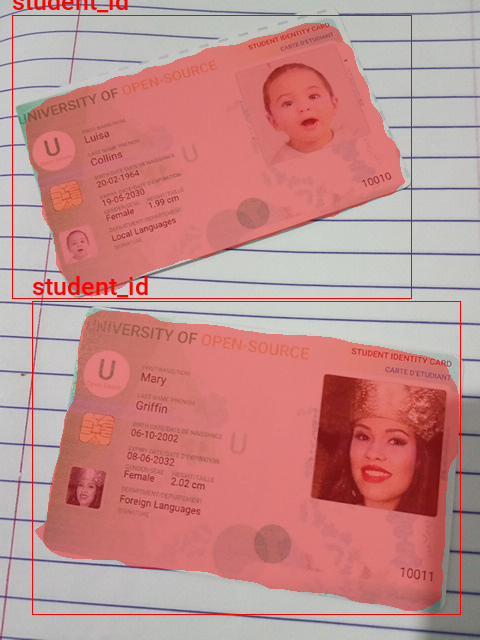

In [106]:
width, height = test_img.size
annotated_img = test_img.copy()
annotated_img.convert('RGBA')
draw = ImageDraw.Draw(annotated_img)
fnt_size = 25

# Iterate through annotations for sample image
for i in range(len(outputs[0])):
    
    # Extract mask array
    mask_array = outputs[-1][i][0]
    # Binarize mask values
    mask_array[mask_array > mask_threshold] = 1.0
    mask_array[mask_array <= mask_threshold] = 0.0
    # Scale mask values
    mask_array *= 255
    # Convert mask from 1-channel to 4-channel
    mask_array = np.tile(mask_array[:, :, None], [1, 1, 4])
    # Update mask color
    mask_array[:,:,0][mask_array[:,:,0] == 255] = mask_rgba[0]
    mask_array[:,:,1][mask_array[:,:,1] == 255] = mask_rgba[1]
    mask_array[:,:,2][mask_array[:,:,2] == 255] = mask_rgba[2]
    # Update mask transparency
    mask_array[:,:,3][mask_array[:,:,0] == 255] = mask_rgba[3]
    mask_array[:,:,3][mask_array[:,:,1] == 255] = mask_rgba[3]
    mask_array[:,:,3][mask_array[:,:,2] == 255] = mask_rgba[3]
    mask_array[:,:,3][mask_array[:,:,0] != 255] = 0
    # Convert mask array to PIL image
    mask_img = PIL.Image.fromarray(mask_array.astype(np.uint8)).convert('RGBA')
    
    # Draw segmentation mask on sample image
    annotated_img.paste(mask_img, (0,0), mask=mask_img)
    
    # Draw bounding box on sample image
    shape = list(outputs[0][i])
    draw.rectangle(shape, outline='red')
    
    # Draw object label on sample image
    fnt = PIL.ImageFont.truetype(font_file, fnt_size)
    label = class_map.get_classes()[outputs[1][i]]
    draw.multiline_text((shape[0], shape[1]-fnt_size-5), f"{label}", font=fnt, fill='red')
    
print(annotated_img.size) 
annotated_img